# Cyklodoprava
Zdroj dat: https://api.golemio.cz/v2/bicyclecounters/detections

In [1]:
import folium
import csv
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt

### Průzkum dat

In [2]:
df = pd.read_csv('counts.csv')
display(df.head())
display(df.info())

,date,camea-BC_VK-SE,camea-BC_VK-HR,camea-BC_VK-UP,camea-VR-VY,camea-VR-ST,camea-BC_HY-WI,camea-BC_HY-NP,camea-RN-KA,camea-RN-JO,...,camea-DU-ST,camea-DU-KR,camea-BC_VK-MO,camea-BC_VK-KO,camea-LO_DE-EV,camea-LO_DE-SA,camea-ST-BA,camea-ST-RA,camea-BC_KR-RA,camea-BC_KR-ZB
0,2020-01-01,NaN,65.0,0.0,9.0,19.0,225.0,0.0,77.0,83.0,...,NaN,NaN,193.0,239.0,NaN,NaN,115.0,176.0,56.0,63.0
1,2020-01-02,NaN,71.0,0.0,104.0,114.0,193.0,0.0,70.0,92.0,...,NaN,NaN,39.0,63.0,NaN,NaN,32.0,54.0,21.0,22.0
2,2020-01-03,NaN,84.0,27.0,108.0,119.0,219.0,0.0,111.0,130.0,...,NaN,NaN,47.0,74.0,NaN,NaN,36.0,56.0,34.0,33.0
3,2020-01-04,NaN,69.0,0.0,60.0,82.0,207.0,0.0,58.0,70.0,...,NaN,NaN,89.0,78.0,NaN,NaN,67.0,119.0,32.0,40.0
4,2020-01-05,NaN,93.0,0.0,69.0,76.0,183.0,0.0,80.0,86.0,...,NaN,NaN,195.0,191.0,NaN,NaN,138.0,173.0,70.0,59.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2191 entries, 0 to 2190
Data columns (total 79 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  2191 non-null   object 
 1   camea-BC_VK-SE        1 non-null      float64
 2   camea-BC_VK-HR        2187 non-null   float64
 3   camea-BC_VK-UP        2187 non-null   float64
 4   camea-VR-VY           2187 non-null   float64
 5   camea-VR-ST           2187 non-null   float64
 6   camea-BC_HY-WI        2187 non-null   float64
 7   camea-BC_HY-NP        2187 non-null   float64
 8   camea-RN-KA           2187 non-null   float64
 9   camea-RN-JO           2187 non-null   float64
 10  camea-BC_NM-CE        2187 non-null   float64
 11  camea-BC_NM-KV        2187 non-null   float64
 12  camea-BC_EU-KT        2187 non-null   float64
 13  camea-BC_EU-OT        2187 non-null   float64
 14  camea-KJ-HO           2187 non-null   float64
 15  camea-KJ-HR          

None

In [3]:
df.date = pd.to_datetime(df.date)

In [4]:
profile = ProfileReport(df, 
                        title="Profiling Report", 
                        correlations={
                            "pearson": {"calculate": False},
                            "spearman": {"calculate": False},
                            "kendall": {"calculate": False},
                            "phi_k": {"calculate": False},
                            "auto": {"calculate": False},
                        },
                        interactions={
                            "continuous": False,
                            "targets": []
                        })
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 79/79 [00:00<00:00, 165.62it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Čištění dat
(korelace je v pořádku)

In [5]:
# Odstranění prázdných sloupců
empty = [col for col in df.columns if df[col].isnull().all()]
df.drop(empty, axis=1, inplace=True)

# Odranění sloupců s nulovou variabilitou
df = df.loc[:, df.nunique() > 1]

# Vyplnění chybějících ostatních hodnot nulou
df = df.fillna(0)

Sloupce s více než 10 % nul: ['camea-VR-VY', 'camea-BC_HY-WI', 'camea-BC_EU-KT', 'camea-BC_EU-OT', 'camea-BC_DS-KJ', 'camea-BC_DS-VL', 'ecoCounter-103047647', 'ecoCounter-104047647', 'camea-BC_AL-PL', 'camea-BC_CB-CH', 'camea-LO_CB-TU', 'camea-BC_BS-BM', 'camea-BC_BS-ZL', 'camea-BC_VK-MO', 'camea-BC_VK-KO', 'camea-ST-BA', 'camea-ST-RA', 'camea-BC_KR-RA', 'camea-BC_KR-ZB']


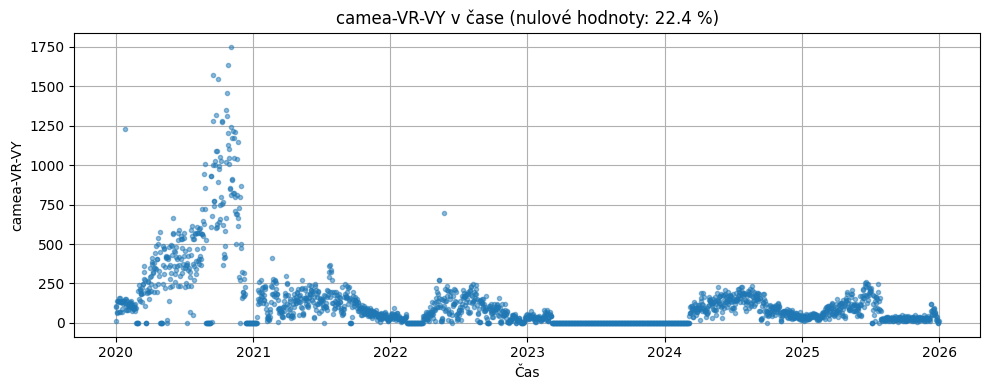

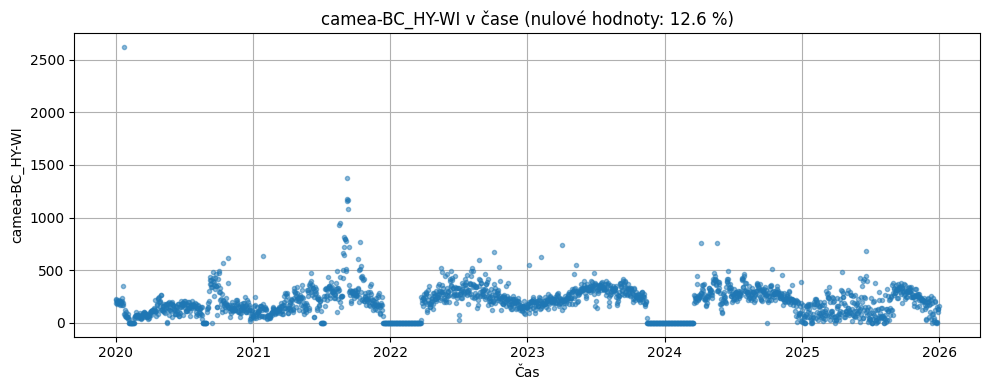

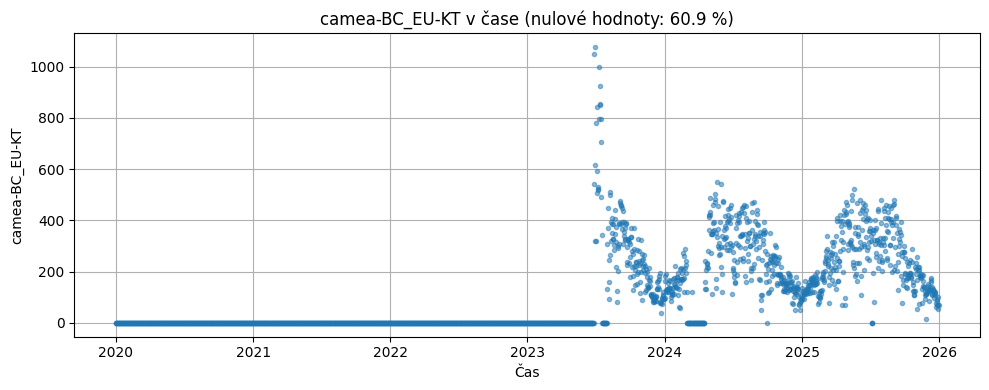

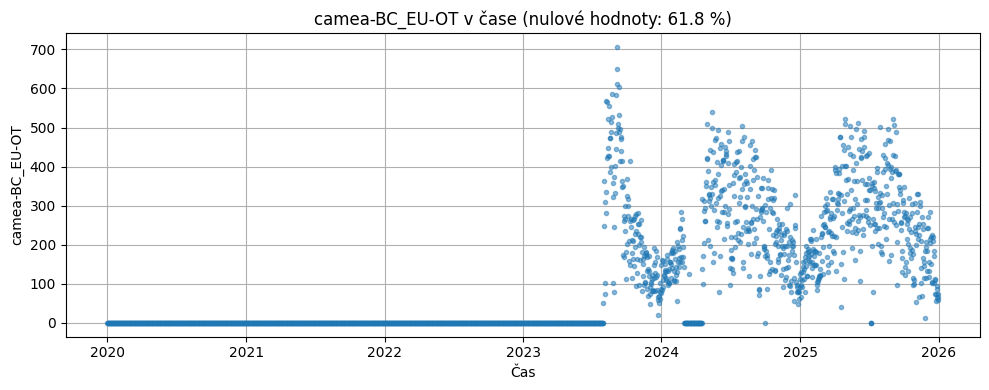

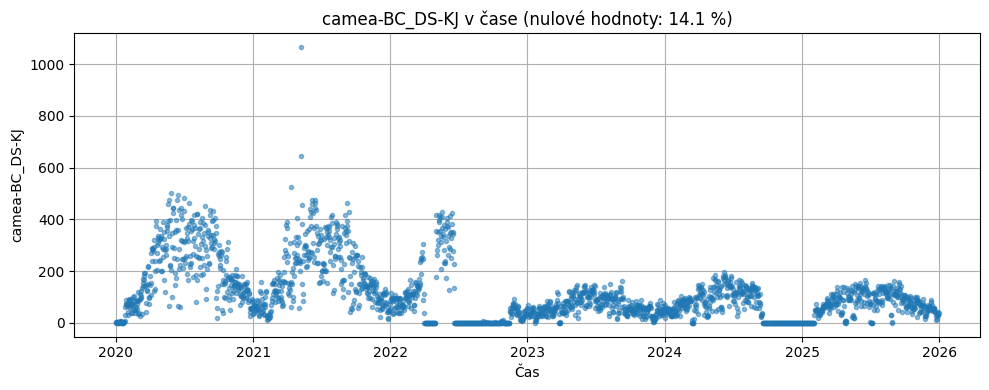

...

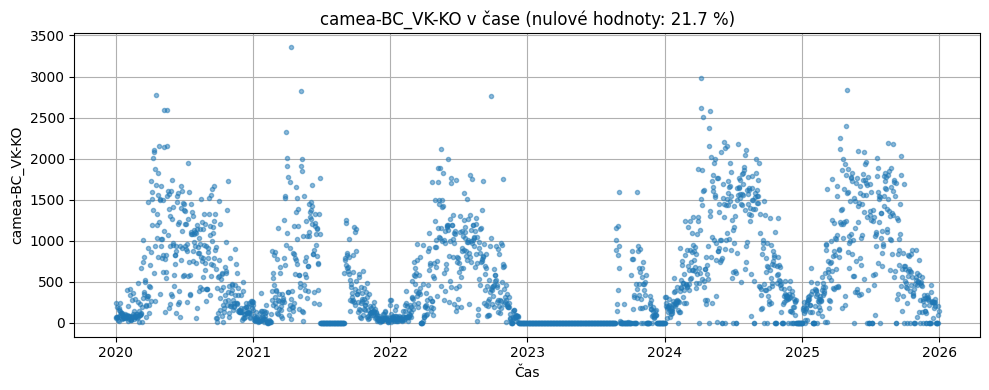

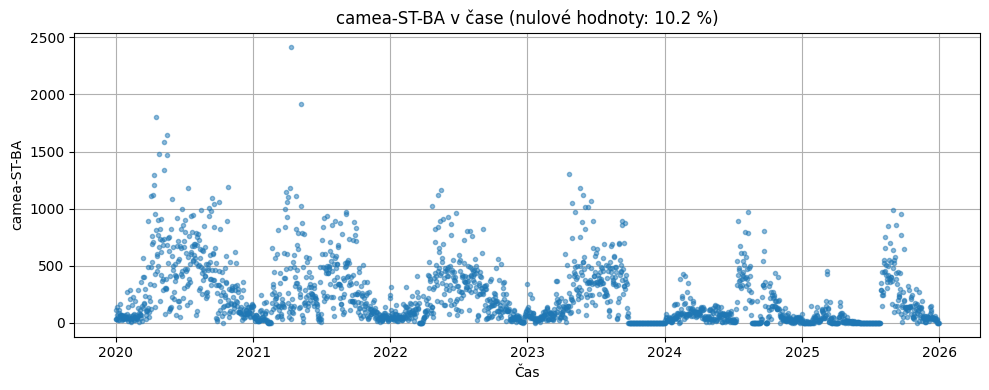

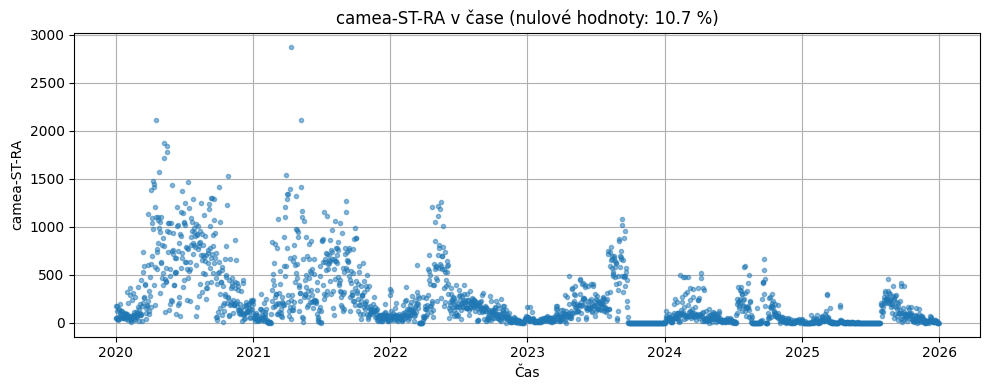

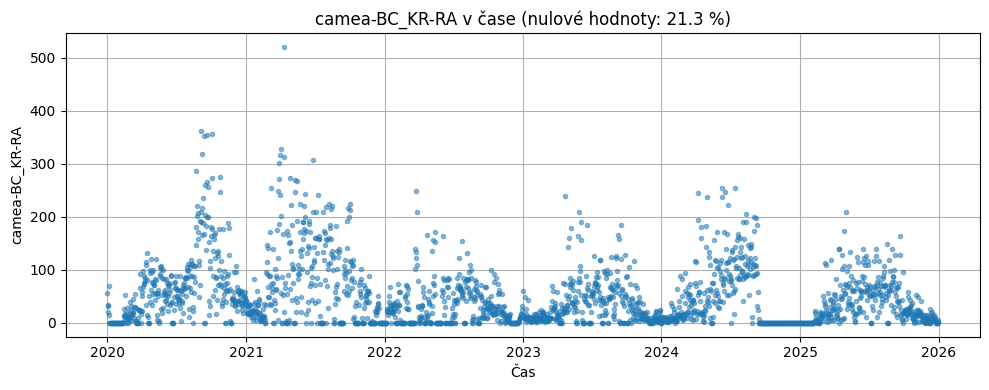

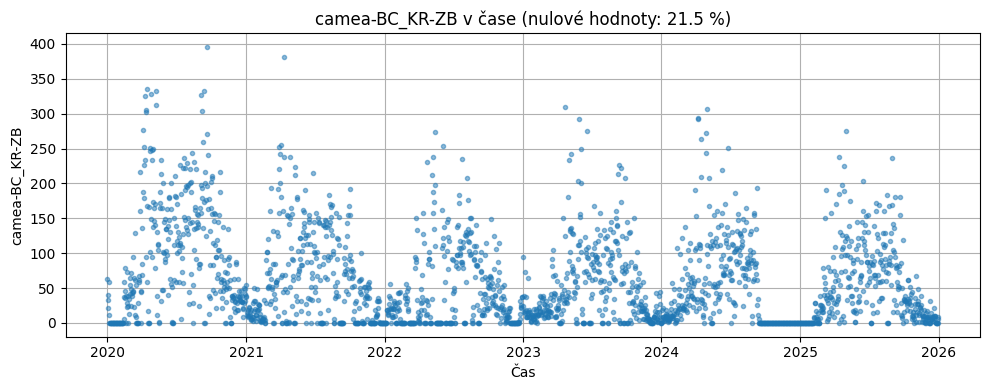

In [6]:
# vykreslení sloupců s více než 10 % nulových hodnot

%matplotlib inline
zero_ratios = (df == 0.0).sum() / len(df)
cols_with_many_zeros = zero_ratios[zero_ratios > 0.10].index

print("Sloupce s více než 10 % nul:", list(cols_with_many_zeros))

for col in cols_with_many_zeros:
    plt.figure(figsize=(10, 4))
    plt.plot(df["date"], df[col], marker=".", linestyle="none", alpha=0.5)
    plt.title(f"{col} v čase (nulové hodnoty: {zero_ratios[col]*100:.1f} %)")
    plt.xlabel("Čas")
    plt.ylabel(col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Z grafů je vidět, že sčítače camea-LO_CB-TU a camea-BC_DS-VL mají poměrně nevyvážené hodnoty - co s tím?

Sčítače camea-BC_EU-KT a camea-BC_EU-OT mají nenulové hodnoty až od poloviny roku 2023, a proto tyto dva také odstraním.


In [7]:
df = df.drop(columns=["camea-BC_EU-KT", "camea-BC_EU-KT"])

In [8]:
df["All"] = df.drop(columns=["date"]).sum(axis=1)
df.to_csv('counts_cleaned.csv', index=False)

### Zobrazení

In [9]:
profile = ProfileReport(df, 
                        title="Profiling Report", 
                        correlations={
                            "pearson": {"calculate": False},
                            "spearman": {"calculate": False},
                            "kendall": {"calculate": False},
                            "phi_k": {"calculate": False},
                            "auto": {"calculate": False},
                        },
                        interactions={
                            "continuous": False,
                            "targets": []
                        })
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 63/63 [00:00<00:00, 311238.11it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
df_counters = pd.read_csv("counters.csv")
valid_ids = df.columns.tolist()
valid_ids.remove("date")
filtered = df_counters[df_counters["direction_id"].isin(valid_ids)]
filtered.to_csv("counters_cleaned.csv", index=False, encoding="utf-8")

In [11]:
map = folium.Map(location=[50.08, 14.42], zoom_start=12)

with open('counters_cleaned.csv', 'r', encoding='utf-8') as f:
    reader = csv.DictReader(f)
    for row in reader:
        lat = float(row['latitude']) if row['latitude'] else None
        lon = float(row['longitude']) if row['longitude'] else None
        if lat and lon:
            popup = f"<b>{row['name']}</b><br>Trasa {row['route']}"
            folium.Marker(location=[lat, lon], popup=popup).add_to(map)

map.save('counters_map.html')

In [12]:
df["year"] = df["date"].dt.year
df_long = df.melt(
    id_vars=["date", "year"],
    value_vars=[c for c in df.columns if c not in ["date", "year", "All"]],
    var_name="counter_id",
    value_name="cyclists"
)
df_long.head()

,date,year,counter_id,cyclists
0,2020-01-01,2020,camea-BC_VK-HR,65.0
1,2020-01-02,2020,camea-BC_VK-HR,71.0
2,2020-01-03,2020,camea-BC_VK-HR,84.0
3,2020-01-04,2020,camea-BC_VK-HR,69.0
4,2020-01-05,2020,camea-BC_VK-HR,93.0


In [13]:
q80 = (
    df_long
    .groupby(["counter_id", "year"])["cyclists"]
    .quantile(0.8)
    .reset_index(name="q80")
)

baseline = (
    q80
    .groupby("counter_id")["q80"]
    .median()
    .reset_index(name="q80_median")
)

q80_all = q80.merge(baseline, on="counter_id", how="left")
q80_all["ratio"] = q80_all["q80"] / q80_all["q80_median"]

q80_all["flag_bad"] = q80_all["ratio"] < 0.5
suspect = q80_all[q80_all["flag_bad"]]
suspect

,counter_id,year,q80,q80_median,ratio,flag_bad
6,camea-BC_AL-ST,2020,71.0,496.6,0.142972,True
7,camea-BC_AL-ST,2021,222.2,496.6,0.447443,True
17,camea-BC_AT-LA,2025,34.2,141.1,0.242381,True
21,camea-BC_AT-ST,2023,67.0,139.5,0.480287,True
23,camea-BC_AT-ST,2025,45.0,139.5,0.322581,True
28,camea-BC_BS-BM,2024,58.0,354.4,0.163657,True
33,camea-BC_BS-ZL,2023,117.6,382.6,0.307371,True
34,camea-BC_BS-ZL,2024,30.0,382.6,0.078411,True
65,camea-BC_DS-VL,2025,0.0,236.6,0.000000,True
66,camea-BC_EU-OT,2020,0.0,110.5,0.000000,True


In [14]:
counter_quality = (
    q80_all
    .groupby("counter_id")["flag_bad"]
    .mean()
    .reset_index(name="bad_year_ratio")
)

valid_counters = q80_all[~q80_all["flag_bad"]]

q80_all["weight"] = q80_all["ratio"].clip(0.3, 1.0)

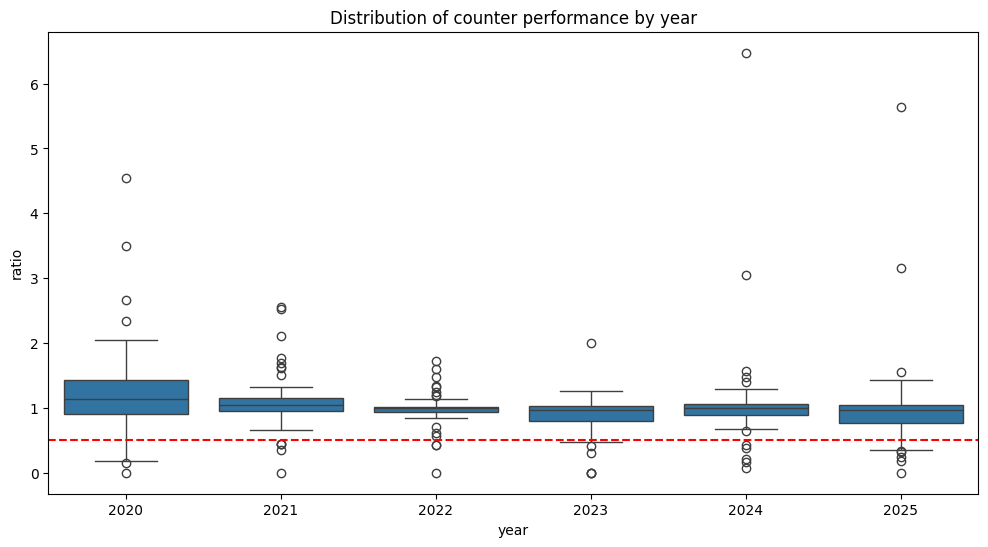

In [15]:
import seaborn as sns

plt.figure(figsize=(12,6))
sns.boxplot(data=q80_all, x="year", y="ratio")
plt.axhline(0.5, color="red", linestyle="--")
plt.title("Distribution of counter performance by year")
plt.show()